In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext line_profiler

In [2]:
from functools import partial

import time
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
# plt.rcParams['text.usetex'] = True
import plotly.express as px
import plotly.graph_objects as go

In [3]:
import jax
import jax.numpy as jnp

import diffrax
import equinox as eqx
import optax

from haiku import PRNGSequence

In [4]:
import exciting_environments as excenvs

import exciting_exciting_systems as eesys
from exciting_exciting_systems.models import NeuralEulerODEPendulum
from exciting_exciting_systems.models.model_utils import simulate_ahead_with_env
from exciting_exciting_systems.models.model_training import ModelTrainer
from exciting_exciting_systems.excitation import loss_function, Exciter

from exciting_exciting_systems.utils.density_estimation import (
    update_density_estimate_single_observation, update_density_estimate_multiple_observations, DensityEstimate
)
from exciting_exciting_systems.utils.signals import aprbs
from exciting_exciting_systems.evaluation.plotting_utils import (
    plot_sequence, append_predictions_to_sequence_plot, plot_sequence_and_prediction, plot_model_performance
)

---

In [5]:
# setup PRNG
key = jax.random.PRNGKey(seed=333) # 21)

data_key, model_key, loader_key, key = jax.random.split(key, 4)
data_rng = PRNGSequence(data_key)

In [6]:
batch_size = 1
tau = 2e-2 # 5e-2

env = excenvs.make(
    env_id='Pendulum-v0',
    batch_size=batch_size,
    tau=tau
)

### Test simulation:

- starting from the intial state/obs ($\mathbf{x}_0$ / $\mathbf{y}_0$)
- apply $N = 999$ actions $\mathbf{u}_0 \dots \mathbf{u}_N$ (**here**: random APRBS actions)
- which results in the state trajectory $\mathbf{x}_0 ... \mathbf{x}_N+1$ with $N+1 = 1000$ elements

In [7]:
obs, state = env.reset()
obs = obs.astype(jnp.float32)
state = state.astype(jnp.float32)
n_steps = 999

actions = aprbs(n_steps, batch_size, 1, 10, next(data_rng))

actions.shape: (1, 999, 1)
observations.shape: (1, 1000, 2)
 
 One of the trajectories:


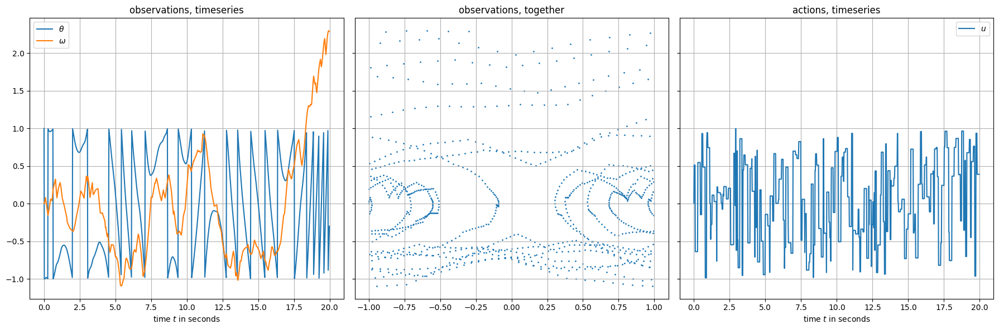

In [8]:
observations = jax.vmap(simulate_ahead_with_env, in_axes=(None, 0, 0, 0, 0, 0, 0))(
    env,
    obs,
    state,
    actions,
    env.env_state_normalizer,
    env.action_normalizer,
    env.static_params
)

print("actions.shape:", actions.shape)
print("observations.shape:", observations.shape)

print(" \n One of the trajectories:")
fig, axs = plot_sequence(
    observations=observations[0, ...],
    actions=actions[0, ...],
    tau=tau,
    obs_labels=[r"$\theta$", r"$\omega$"],
    action_labels=[r"$u$"],
);
plt.show()

In [9]:
bandwidth = 0.1
n_grid_points = 100**2

density_estimate = DensityEstimate(
    p=jnp.zeros([batch_size, n_grid_points, 1]),
    x_g=eesys.utils.density_estimation.build_grid_2d(
        low=env.env_observation_space.low,
        high=env.env_observation_space.high,
        points_per_dim=jnp.sqrt(n_grid_points).astype(jnp.int32)
    ),
    bandwidth=jnp.array([bandwidth]),
    n_observations=jnp.array([0])
)

density_estimate = jax.vmap(
    update_density_estimate_multiple_observations,
    in_axes=(DensityEstimate(0, None, None, None), 0),
    out_axes=(DensityEstimate(0, None, None, None))
)(
    density_estimate,
    observations,
)

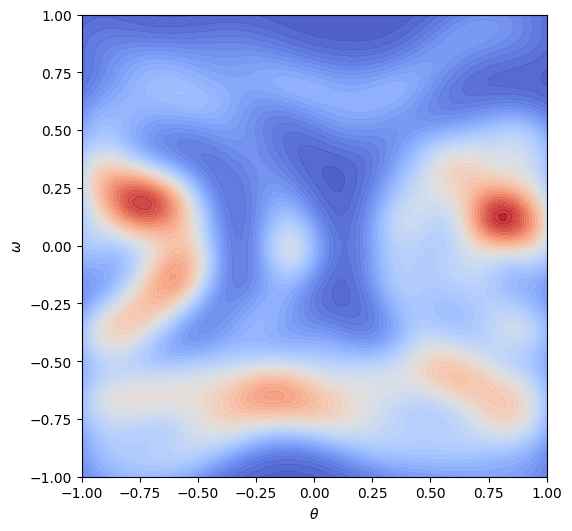

In [10]:
fig, axs, cax = eesys.evaluation.plotting_utils.plot_2d_kde_as_contourf(
    density_estimate.p, density_estimate.x_g, [r"$\theta$", r"$\omega$"]
)

- For the ```DensityEstimate```-structure, it should not really make a difference, whether the action is part of the density estimate. It just makes a difference for the updating functions
- What about the plotting functions? How can I plot the 3-dimensional estimate?

In [11]:
density_estimate = DensityEstimate(
    p=jnp.zeros([batch_size, n_grid_points, 1]),
    x_g=eesys.utils.density_estimation.build_grid_2d(
        low=env.env_observation_space.low,
        high=env.env_observation_space.high,
        points_per_dim=jnp.sqrt(n_grid_points).astype(jnp.int32)
    ),
    bandwidth=jnp.array([bandwidth]),
    n_observations=jnp.array([0])
)

In [12]:
density_estimate.x_g.shape

(10000, 2)

- Start by building a 3d grid
- understand what it is you are building here :)

In [13]:
def build_grid_3d(low, high, points_per_dim):
    x1, x2, x3 = [
        jnp.linspace(low, high, points_per_dim),
        jnp.linspace(low, high, points_per_dim),
        jnp.linspace(low, high, points_per_dim)
    ]

    x_g = jnp.meshgrid(*[x1, x2, x3])
    x_g = jnp.stack([_x for _x in x_g], axis=-1)
    x_g = x_g.reshape(-1, 3)

    assert x_g.shape[0] == points_per_dim**3
    return x_g

In [14]:
build_grid_3d(-1, 1, 100).shape

(1000000, 3)

In [15]:
points_per_dim = 100
n_grid_points=points_per_dim**3
density_estimate = DensityEstimate(
    p=jnp.zeros([batch_size, n_grid_points, 1]),
    x_g=build_grid_3d(-1, 1, points_per_dim),
    bandwidth=jnp.array([bandwidth]),
    n_observations=jnp.array([0])
)

density_estimate = jax.vmap(
    update_density_estimate_multiple_observations,
    in_axes=(DensityEstimate(0, None, None, None), 0),
    out_axes=(DensityEstimate(0, None, None, None))
)(
    density_estimate,
    jnp.concatenate([observations[..., 0:-1, :], actions], axis=-1),
)

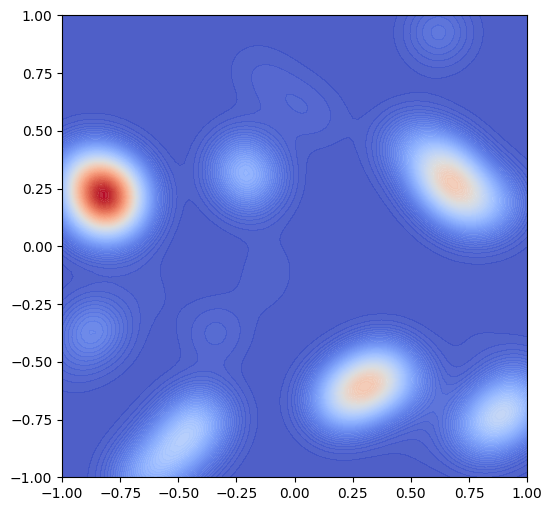

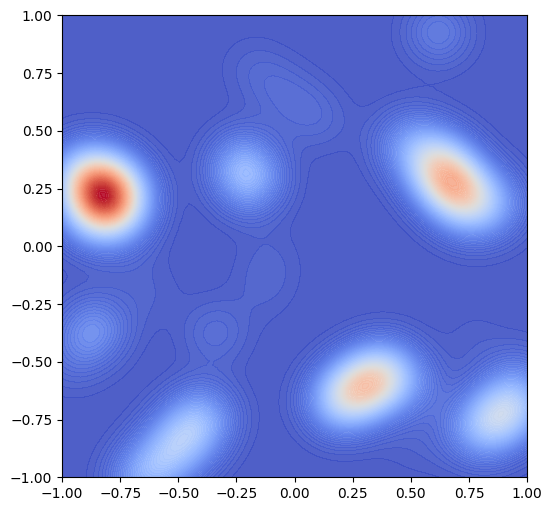

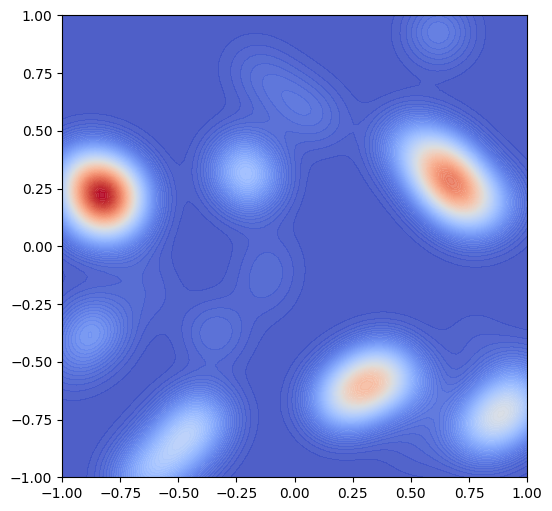

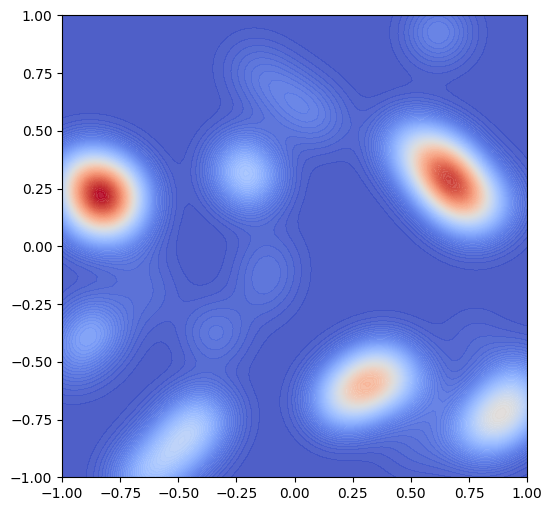

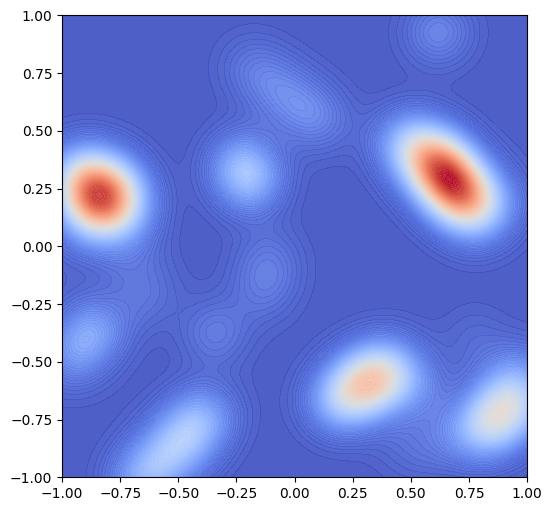

...

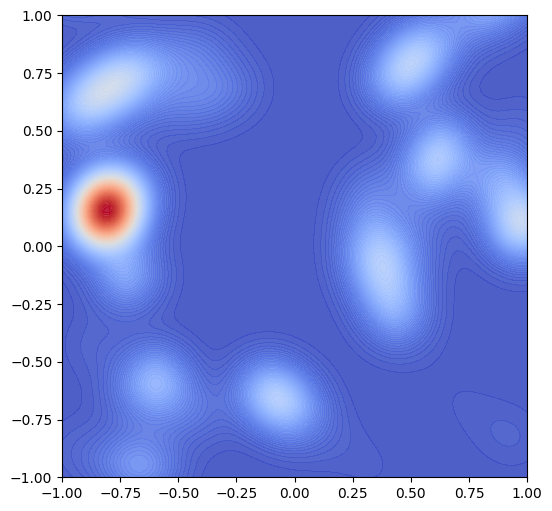

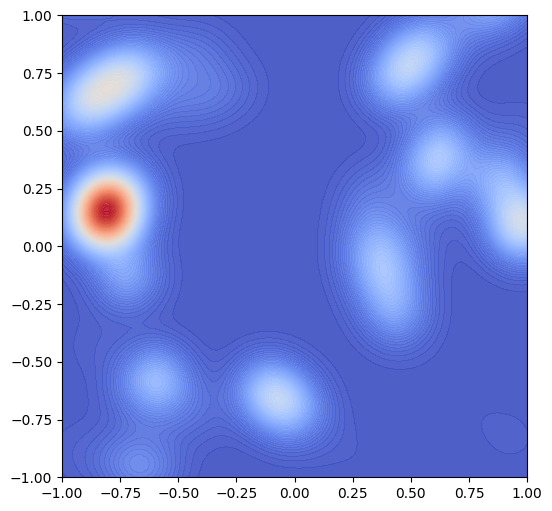

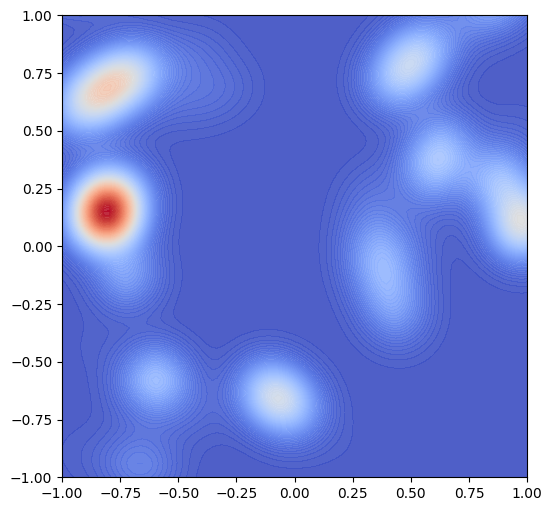

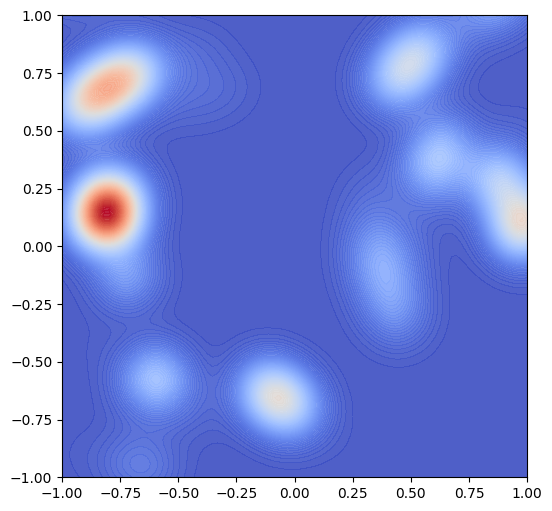

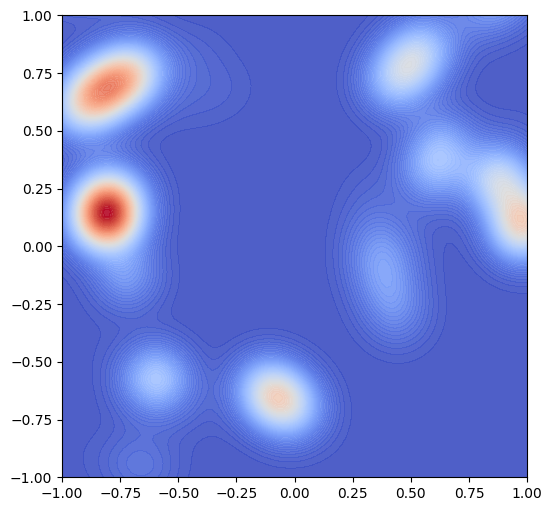

In [16]:
x_plot = density_estimate.x_g.reshape((points_per_dim, points_per_dim, points_per_dim, 3))


for i in range(points_per_dim):
    fig, axs = plt.subplots(
        figsize=(6, 6)
    )
    cax = axs.contourf(
        x_plot[:, :, 0, :-1][..., 0],
        x_plot[:, :, 0, :-1][..., 1],
        density_estimate.p[0].reshape((points_per_dim, points_per_dim, points_per_dim))[..., i],
        #jnp.sum(density_estimate.p[0].reshape((points_per_dim, points_per_dim, points_per_dim)), axis=-1),
        antialiased=False,
        levels=100,
        alpha=0.9,
        cmap=plt.cm.coolwarm
    )
    plt.show()

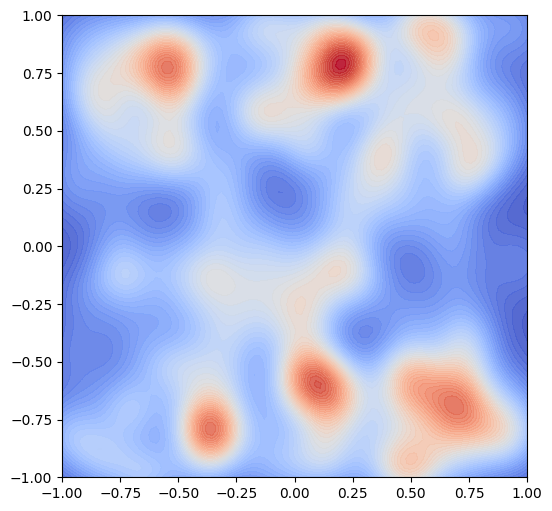

In [17]:
x_plot = density_estimate.x_g.reshape((points_per_dim, points_per_dim, points_per_dim, 3))

fig, axs = plt.subplots(
    figsize=(6, 6)
)

cax = axs.contourf(
    x_plot[:, :, 0, :-1][..., 0], # does it make sense that this does not change between dimensions?
    x_plot[:, :, 0, :-1][..., 1],
    jnp.sum(density_estimate.p[0].reshape((points_per_dim, points_per_dim, points_per_dim)), axis=0),
    antialiased=False,
    levels=50,
    alpha=0.9,
    cmap=plt.cm.coolwarm
)
plt.show()

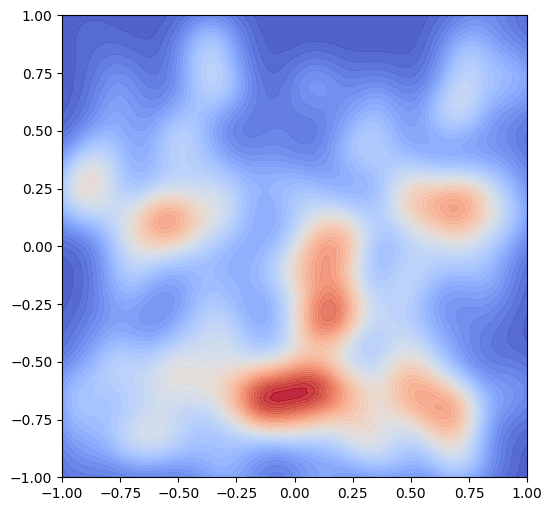

In [18]:
x_plot = density_estimate.x_g.reshape((points_per_dim, points_per_dim, points_per_dim, 3))

fig, axs = plt.subplots(
    figsize=(6, 6)
)

cax = axs.contourf(
    x_plot[:, :, 0, :-1][..., 0], # does it make sense that this does not change between dimensions?
    x_plot[:, :, 0, :-1][..., 1],
    jnp.sum(density_estimate.p[0].reshape((points_per_dim, points_per_dim, points_per_dim)), axis=1),
    antialiased=False,
    levels=50,
    alpha=0.9,
    cmap=plt.cm.coolwarm
)
plt.show()

- visualizing ct scans? I mean its more or less the same thing

In [ ]:
# theoretically nice, practically useless
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter(*density_estimate.x_g.T, c=jnp.squeeze(density_estimate.p[0]), cmap=plt.hot())
fig.colorbar(img)
plt.show()